# HW_3_CLUSTERIZATION

In [132]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN, AffinityPropagation
from sklearn.metrics import adjusted_rand_score, silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score, silhouette_score
from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
import io
import numpy as np
import matplotlib.pyplot as plt

from skimage import data, img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error

from time import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.datasets import load_sample_image
from sklearn.metrics import pairwise_distances_argmin
from sklearn.utils import shuffle

In [133]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import skimage
def draw_picture(image, title, bgr=False):
    b, g, r = cv2.split(image) # по умолчанию cv2 почему-то отдает цвета в порядке BGR вместо RGB
    new_image = cv2.merge([r, g, b])
    plt.figure(figsize=(7, 5))
    plt.axis('off')
    plt.imshow(new_image)
    plt.title(title)
    plt.show()

In [134]:
import warnings
warnings.filterwarnings('ignore')

In [135]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    return codebook[labels].reshape(w, h, -1)

In [136]:
klumba = cv2.imread('Klumba.jpg')

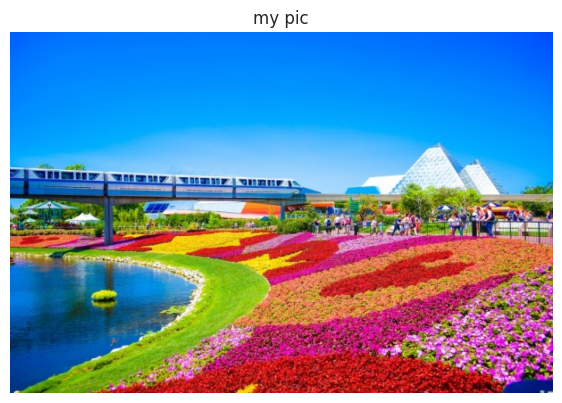

In [137]:
draw_picture(klumba, 'my pic', bgr=False)

### 1. Загрузите картинку и приведите ее к квадратной форме и размеру 128*128:

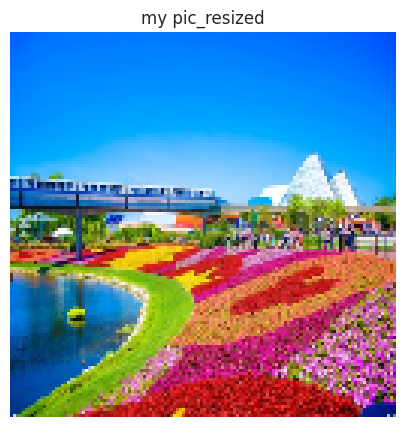

In [138]:
klumba_resized = cv2.resize(klumba, (128, 128))
draw_picture(klumba_resized, 'my pic_resized', bgr=False)

### 2. Реализуйте три модели класстеризации: KMeans, DBSCAn, AgglomerativeClustering

#### 2a. KMeans

In [139]:
# Load Image and transform to a 2D numpy array.
w, h, d = original_shape = tuple(klumba_resized.shape)
assert d == 3
image_array = klumba_resized.reshape(w * h, d)

- Вытяните картинку в трехмерный вектор:

In [140]:
X = image_array.copy()
X.shape

(16384, 3)

- к вектору трех каналов примените модель KMeans с разным числом кластеров (2,5,10 и 20):

- дополнительно в цикле сохраняйте значения инерции класстеров, а также structure similarity index (ssim)

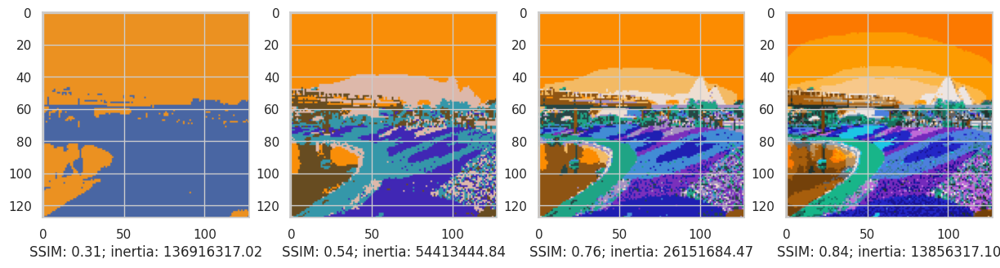

In [141]:
n_colors = 64
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
k_inertia = []
k_img = []
K = [2, 5, 10, 20]
for ax, k in zip(axes,K):
    clf_kmeans = KMeans(n_clusters=k).fit(image_array)
    w, h, d = original_shape = tuple(klumba_resized.shape)
    # fit_predict
    clusters_kmeans = clf_kmeans.predict(image_array)
    k_inertia.append(clf_kmeans.inertia_)
    w, h, d = original_shape = tuple(klumba_resized.shape)
    img = (recreate_image(clf_kmeans.cluster_centers_, clusters_kmeans, w, h)).astype(np.uint8)
    k_img.append(img.reshape(w * h, d))
    ssim_const= ssim(klumba_resized, img, multichannel=True)
    ax.set_xlabel(f'SSIM: {ssim_const:.2f}; inertia: {k_inertia[-1]:.2f}')
    ax.imshow(img)


- Визализируйте полученные кластеры при разном числе к:

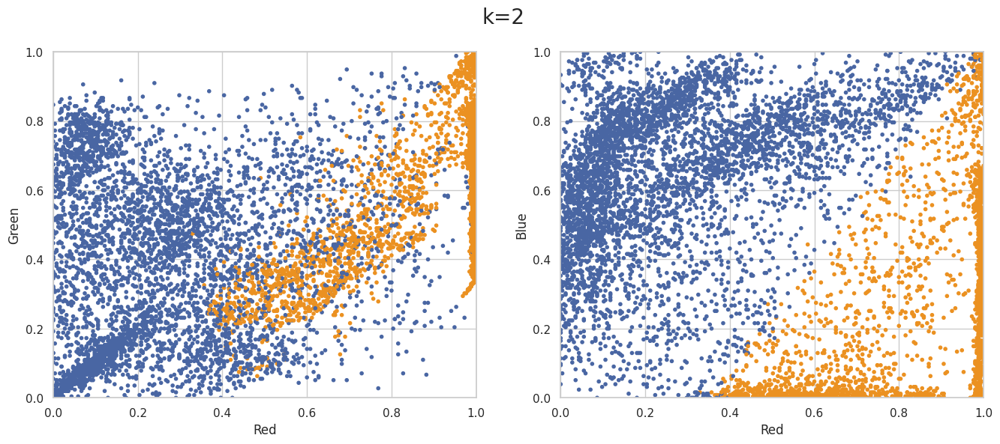

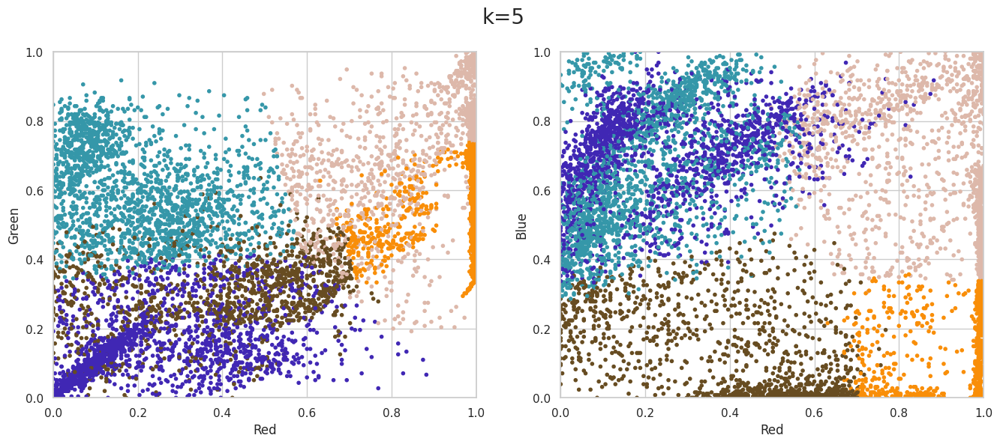

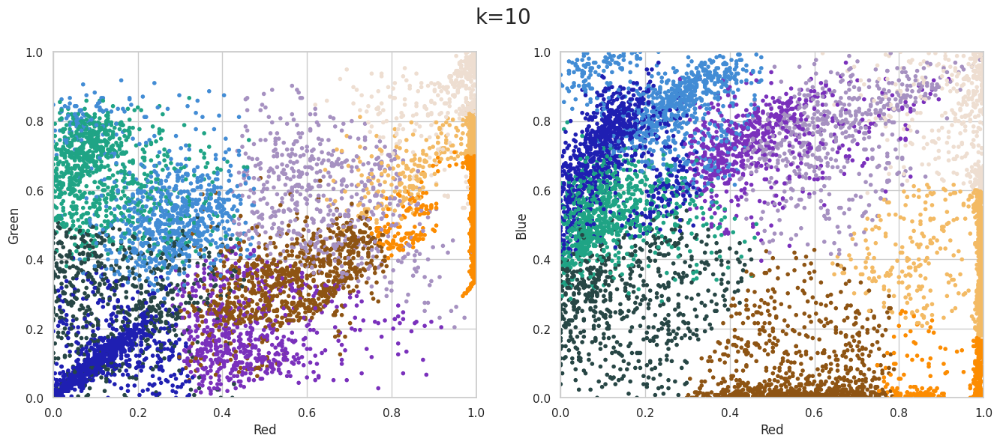

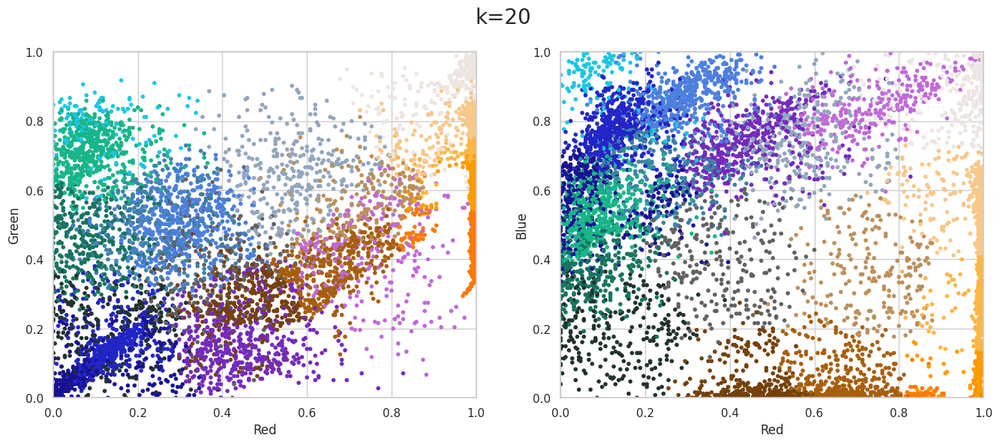

In [142]:
def plot_pixels(data, title, colors=None, N=10000):
    if colors is None:
      colors = data
    # choose a random subset
    rng = np.random.RandomState(0)
    i = rng.permutation(data.shape[0])[:N]
    colors = colors[i]
    R, G, B = data[i].T
    fig, ax = plt.subplots(1, 2, figsize=(16, 6))
    ax[0].scatter(R, G, color=colors, marker='.')
    ax[0].set(xlabel='Red', ylabel='Green', xlim=(0, 1), ylim=(0, 1))

    ax[1].scatter(R, B, color=colors, marker='.')
    ax[1].set(xlabel='Red', ylabel='Blue', xlim=(0, 1), ylim=(0, 1))

    fig.suptitle(title, size=20);

plot_pixels(image_array / 255.0, colors = k_img[0] / 255.0, title='k=2')
plot_pixels(image_array / 255.0, colors = k_img[1] / 255.0, title='k=5')
plot_pixels(image_array / 255.0, colors = k_img[2] / 255.0, title='k=10')
plot_pixels(image_array / 255.0, colors = k_img[3] / 255.0, title='k=20')

#### 2b DBSCAN

- Вытяните картинку в трехмерный вектор:

In [143]:
w, h, d = original_shape = tuple(klumba_resized.shape)
shuffled_klumba = klumba_resized.reshape(w * h, d)

-  Примените DBSCAN к трехмерному вектору изображения

- дополнительно посчитайте structure similarity index (ssim)

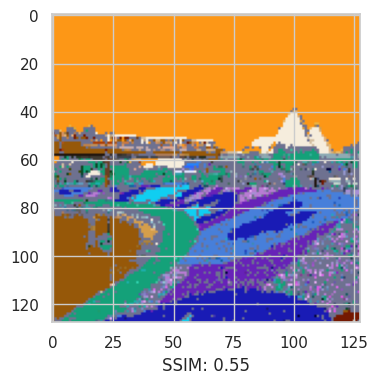

In [144]:
from sklearn.cluster import DBSCAN
fig, axes = plt.subplots(1, 1, figsize=(15, 4))
k_img = []
clustering = DBSCAN(eps = 8).fit(shuffled_klumba)
# fit_predict
labels = clustering.labels_
new_klumba_of_dbscan = shuffled_klumba.copy()
for i in np.unique(labels):
  current = new_klumba_of_dbscan[labels == i, :]
  new_klumba_of_dbscan[labels == i] = np.mean(current, axis=0)
klustering_image = new_klumba_of_dbscan.reshape(w, h, d)
k_img.append(klustering_image.reshape(w * h, d))
ssim_const= ssim(klumba_resized, klustering_image, multichannel=True)
axes.set_xlabel(f'SSIM: {ssim_const:.2f}')
axes.imshow(klustering_image)

- Визализируйте полученные кластеры при после прменнеия DBSCAN:

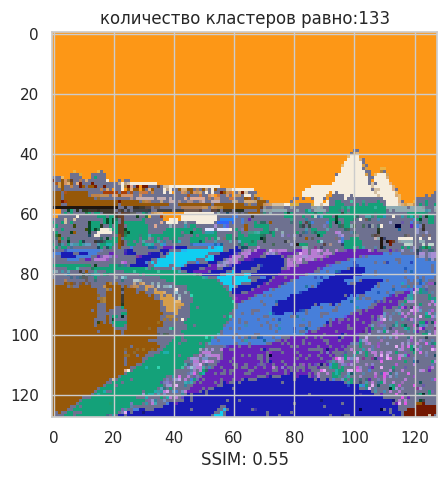

In [145]:
plt.figure(figsize = (5,5))
plt.imshow(klustering_image)
plt.title(f'количество кластеров равно:{len(np.unique(clustering.labels_))}')

plt.xlabel(f'SSIM: {ssim_const:.2f}')
plt.show()

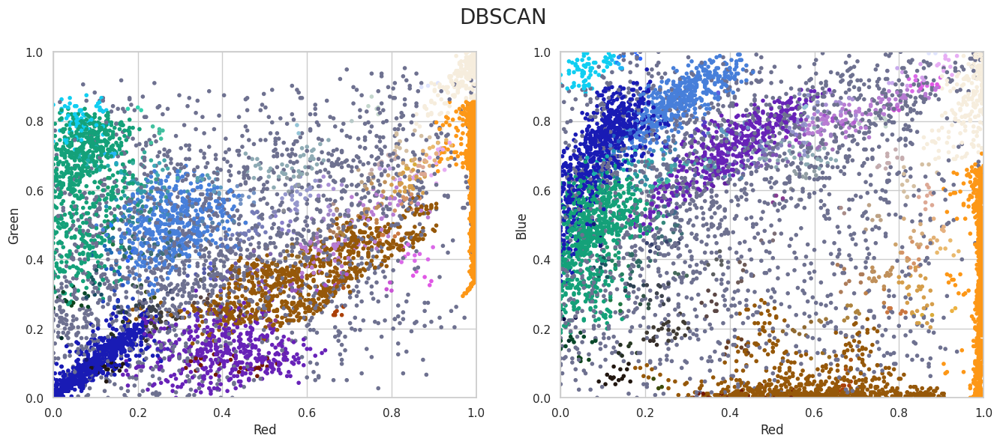

In [146]:
plot_pixels(image_array / 255.0, colors = k_img[0] / 255.0, title='DBSCAN')

#### 2c AgglomerativeClustering

In [147]:
w, h, d = original_shape = tuple(klumba_resized.shape)
shuffled_klumba = klumba_resized.reshape(w * h, d)

- к вектору трех каналов примените AgglomerativeClustering с разным числом кластеров (2,5,10 и 20):

- дополнительно в цикле сохраняйте structure similarity index (ssim)

- Визализируйте полученные кластеры

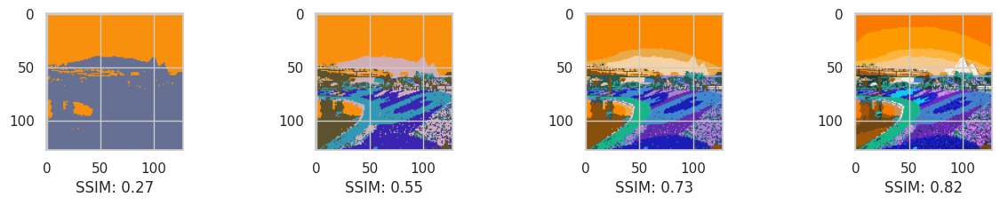

In [148]:
fig, axes = plt.subplots(1, 4, figsize=(15, 2))
K = [2, 5, 10, 20]
k_img = []
for ax, k in zip(axes,K):
    clf_aggclus = AgglomerativeClustering(n_clusters=k).fit(shuffled_klumba)
    #fit_predict the model
    labels = clf_aggclus.labels_
    new_klumba_of_aggl = shuffled_klumba.copy()
    for i in np.unique(labels):
        current = new_klumba_of_aggl[labels == i, :]
        new_klumba_of_aggl[labels == i] = np.mean(current, axis=0)
    klustering_image = new_klumba_of_aggl.reshape(w, h, d)
    k_img.append(klustering_image.reshape(w * h, d))
    ssim_const = ssim(klumba_resized, klustering_image, multichannel=True)
    ax.set_xlabel(f'SSIM: {ssim_const:.2f}')
    ax.imshow(klustering_image)

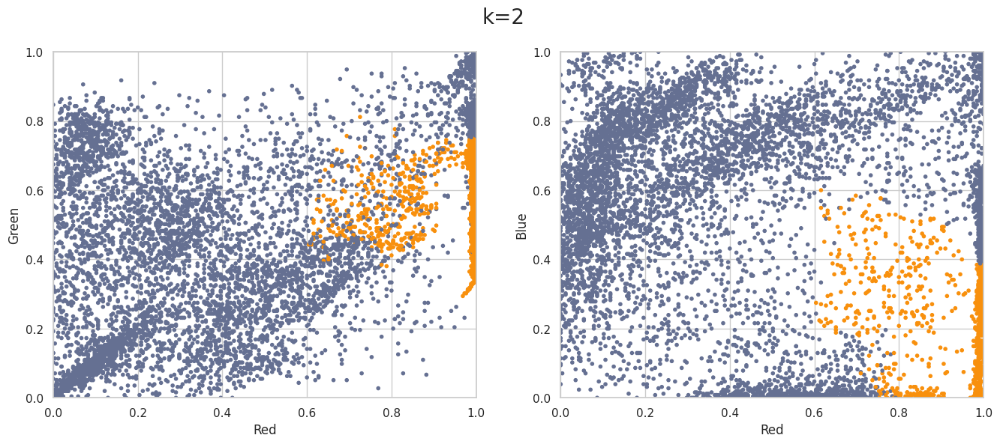

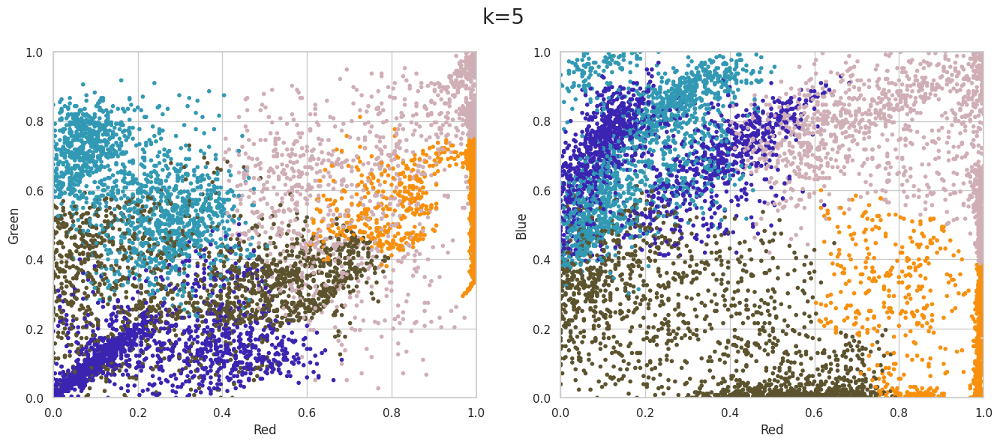

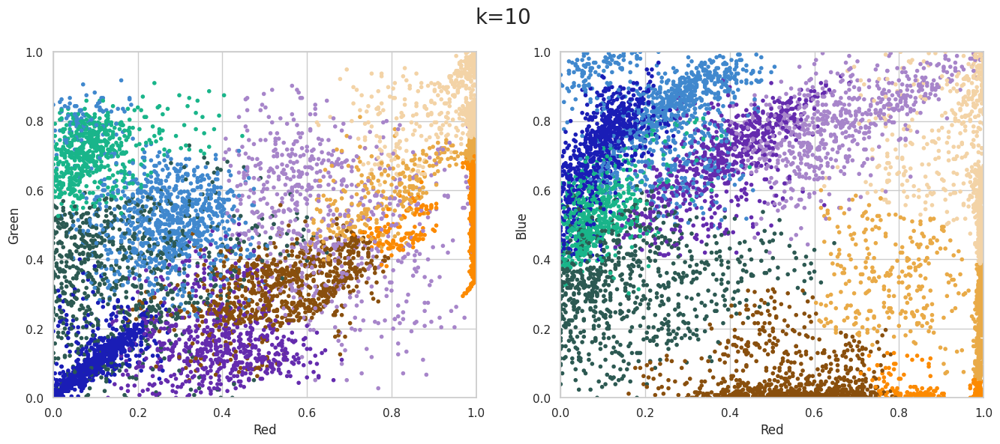

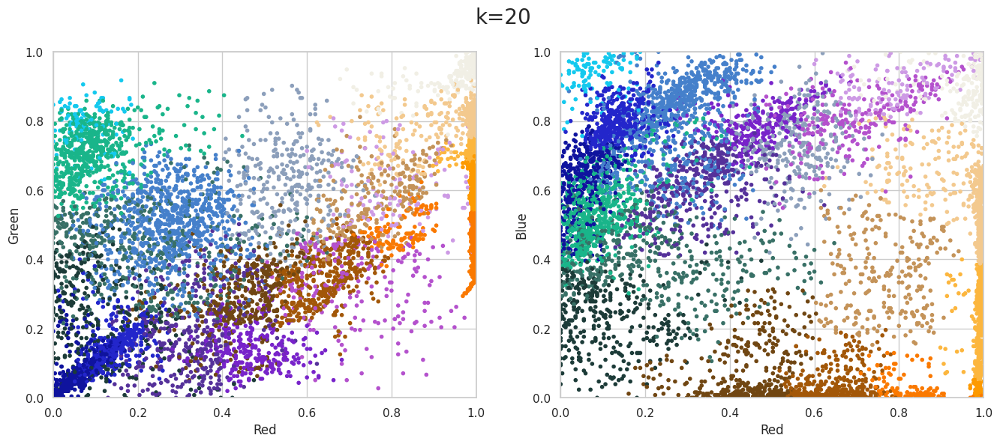

In [149]:
plot_pixels(image_array / 255.0, colors = k_img[0] / 255.0, title='k=2')
plot_pixels(image_array / 255.0, colors = k_img[1] / 255.0, title='k=5')
plot_pixels(image_array / 255.0, colors = k_img[2] / 255.0, title='k=10')
plot_pixels(image_array / 255.0, colors = k_img[3] / 255.0, title='k=20')

### 3. Какой из трех алгоритмов кластреизации работает лучше на данной картинке? Почему?

- Сделайте предполежения и выводы

KMeans и AgglomerativeClustering сработали примерно одинаково, а DBSCAN показал маленькую точность по метрике ssim. Следовательно на данной картинке лучше всего работает KMeans или AgglomerativeClustering. DBSCAN не может хорошо кластеризовать наборы данных с большой разницей в плотности, поскольку не удается выбрать приемлемое значение eps для всех кластеров.

## Методы понижения размерности


### 4. Примените методы понижения размерности: PCA, t-SNE и UMAP к изображениям клеток крови из датасета BloodMNIST.

Отобразите проекцию данных на двумерное пространство, так как это допускает наиболее простую визуализацию полученного результата (воспользуйтесь [`sns.scatterplot`](https://seaborn.pydata.org/generated/seaborn.scatterplot.html)).  Какой метод позволяет лучше разделить данные в пространстве? Опишите ваши наблюдения.

Произведем загрузку данных:

In [150]:
!pip install medmnist

In [151]:
import medmnist
from medmnist import INFO, Evaluator
import dataset_without_pytorch
import pandas as pd
from dataset_without_pytorch import get_loader
data_flag = 'bloodmnist'
download = True

info = INFO[data_flag]
task = info['task']
n_channels = info['n_channels']
n_classes = len(info['label'])

DataClass = getattr(dataset_without_pytorch, info['python_class'])

# load the data
bloodmnist = DataClass(split='train', download=download)
print(bloodmnist)

Using downloaded and verified file: /root/.medmnist/bloodmnist.npz
Dataset BloodMNIST (bloodmnist)
    Number of datapoints: 11959
    Root location: /root/.medmnist
    Split: train
    Task: multi-class
    Number of channels: 3
    Meaning of labels: {'0': 'basophil', '1': 'eosinophil', '2': 'erythroblast', '3': 'immature granulocytes(myelocytes, metamyelocytes and promyelocytes)', '4': 'lymphocyte', '5': 'monocyte', '6': 'neutrophil', '7': 'platelet'}
    Number of samples: {'train': 11959, 'val': 1712, 'test': 3421}
    Description: The BloodMNIST is based on a dataset of individual normal cells, captured from individuals without infection, hematologic or oncologic disease and free of any pharmacologic treatment at the moment of blood collection. It contains a total of 17,092 images and is organized into 8 classes. We split the source dataset with a ratio of 7:1:2 into training, validation and test set. The source images with resolution 3×360×363 pixels are center-cropped into 3×2

Доступ к данным идет посредством обращения к ключу `bloodmnist.imgs`, доступ к разметке классов через `bloodmnist.labels`

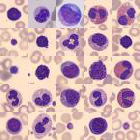

In [152]:
x = bloodmnist.imgs / 255.
x = x.reshape(-1, 2352)
y = pd.Series(bloodmnist.labels.reshape(-1))
y = y.astype('int').map(dict(zip(range(0, 8), info['label'].values())))
bloodmnist.montage(length=5)

In [153]:
print(x)

[[0.98039216 0.8745098  0.80784314 ... 1.         0.89411765 0.78823529]
 [1.         0.90980392 0.83529412 ... 0.69019608 0.55294118 0.5372549 ]
 [0.7254902  0.56862745 0.60392157 ... 0.83921569 0.68235294 0.68627451]
 ...
 [0.94901961 0.9372549  0.6745098  ... 0.83137255 0.69411765 0.68627451]
 [0.80392157 0.6627451  0.67843137 ... 0.99215686 0.8745098  0.83137255]
 [0.76862745 0.62352941 0.6        ... 0.87843137 0.72941176 0.7254902 ]]


In [154]:
print(y)

0                                                 platelet
1        immature granulocytes(myelocytes, metamyelocyt...
2                                               neutrophil
3                                               neutrophil
4                                                 platelet
                               ...                        
11954                                           neutrophil
11955                                         erythroblast
11956                                           eosinophil
11957                                           neutrophil
11958                                           lymphocyte
Length: 11959, dtype: object


### 4a PCA

In [155]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
xa = pca.fit_transform(x)
print(xa)

[[ 7.72601927  2.5109252 ]
 [-4.97371104  3.22438272]
 [ 1.6063136  -1.94856451]
 ...
 [-2.84528072 -0.82814273]
 [-0.96777763  0.64958005]
 [ 1.60302842 -2.95331866]]


Text(0, 0.5, 'Y')

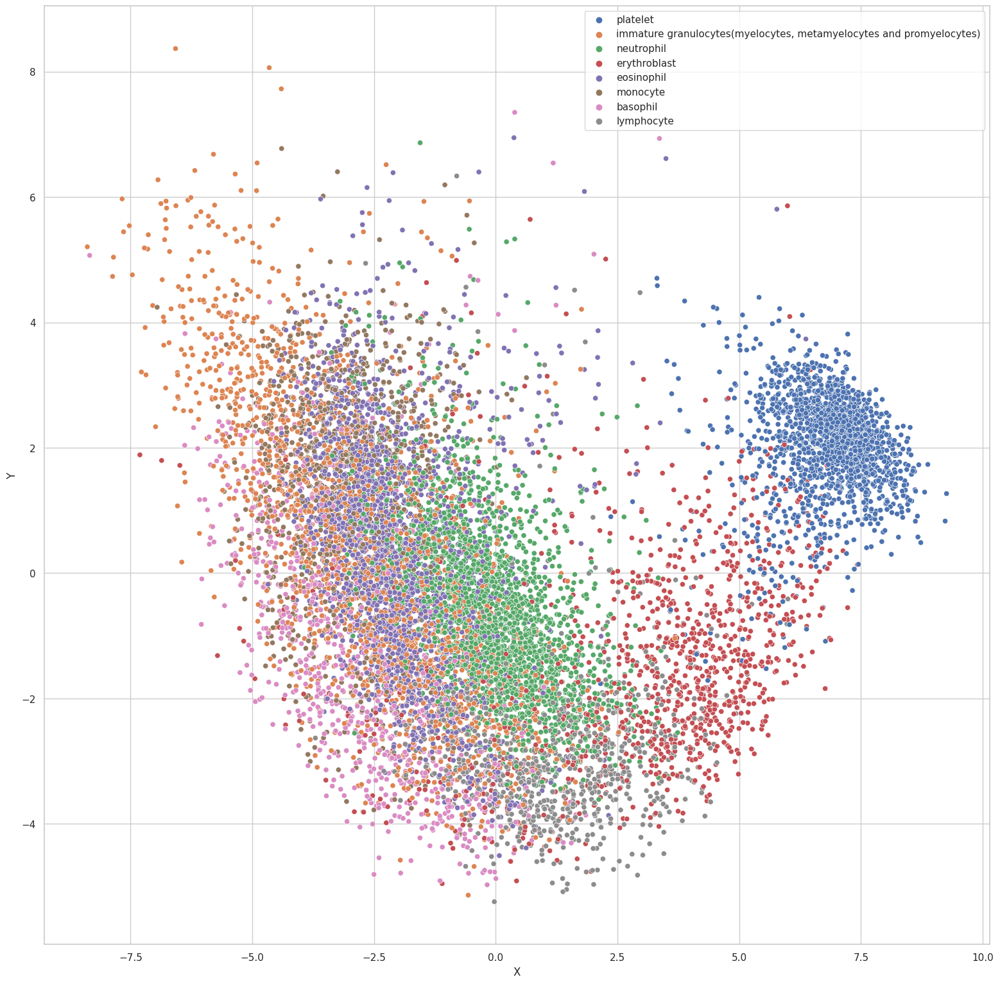

In [156]:
sns.scatterplot(x=xa[:, 0], y=xa[:, 1], hue=y)
plt.xlabel('X')
plt.ylabel('Y')

### 4b t-SNE

In [157]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
xb = tsne.fit_transform(x)
print(xb)

[[ 86.23166     11.433575  ]
 [-61.67948     -0.9339167 ]
 [ 20.144764    -0.79087573]
 ...
 [-28.904549   -36.644196  ]
 [-31.121006    26.228754  ]
 [ 33.360172   -20.27393   ]]


Text(0, 0.5, 'Y')

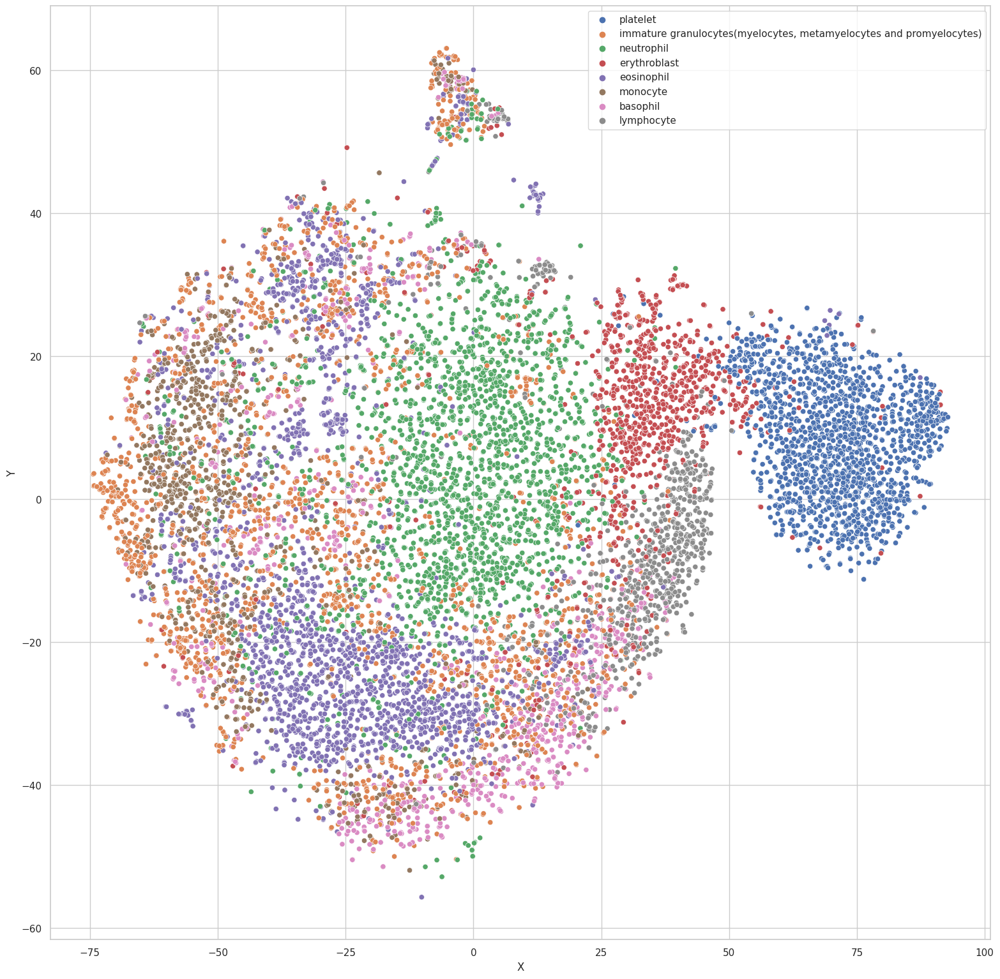

In [158]:
sns.scatterplot(x=xb[:, 0], y=xb[:, 1], hue=y)
plt.xlabel('X')
plt.ylabel('Y')

### 4c UMAP

In [159]:
!pip install umap-learn

In [160]:
import umap.umap_ as umap

umap = umap.UMAP(n_components=2)
xc = umap.fit_transform(x)
print(xc)

[[ 2.0319963  5.003741 ]
 [13.508016   8.998328 ]
 [ 9.059547   3.7117484]
 ...
 [13.203299   5.6027927]
 [10.965703   7.630196 ]
 [ 9.032963   2.4864287]]


Text(0, 0.5, 'Y')

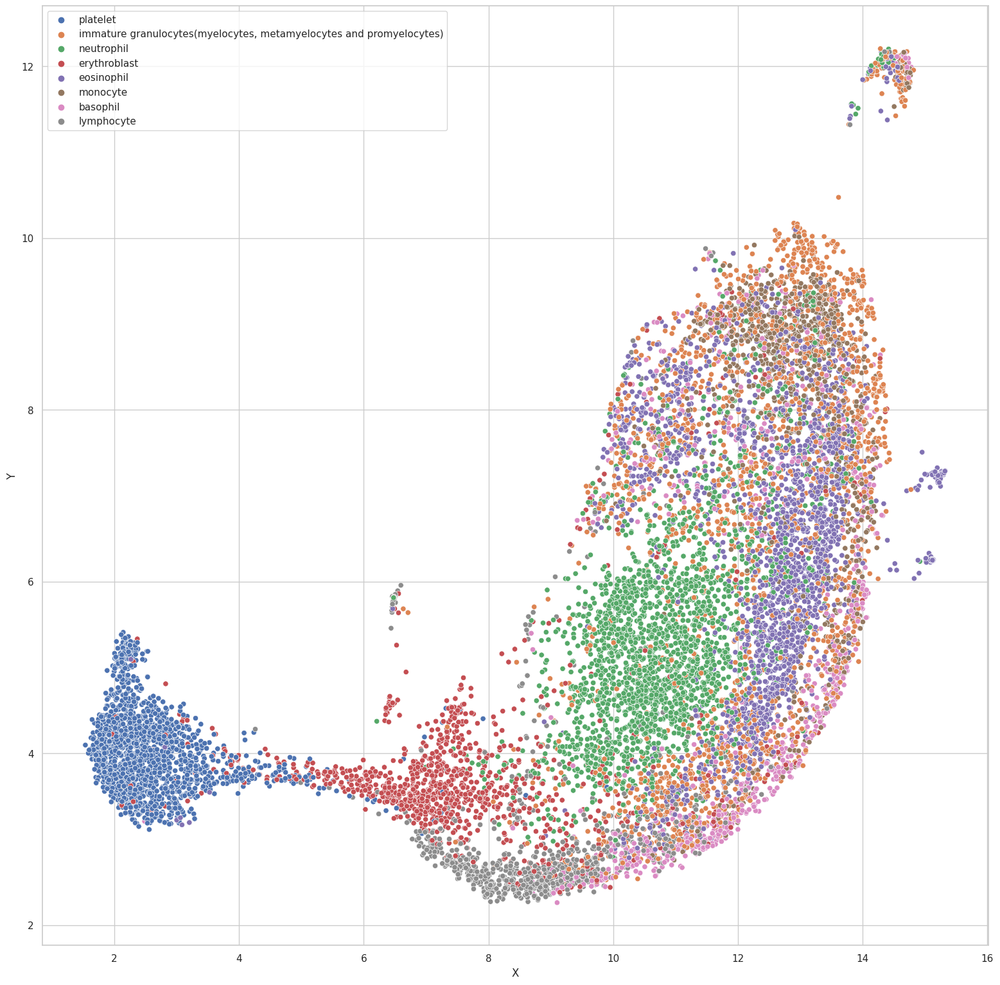

In [161]:
sns.scatterplot(x=xc[:, 0], y=xc[:, 1], hue=y)
plt.xlabel('X')
plt.ylabel('Y')

Выводы:

PCA является линейным алгоритмом, присваивающим равные веса всем попарным расстояниям.

Что касается t-SNE и UMAP, то они не линейны, и умеют определять приоритеты расстояний между соседями, что дает возможность выявить внутреннюю двумерность данных.

При этом отличие t-SNE от UMAP заключается в том, что последний лучше сохраняет глобальную структуру при выводе итоговых результатов.

Заметно, что UMAP уплотнил данные и развел большинство из них сильнее, чем t-SNE и PCA.

UMAP лучше отражает внутреннюю структуру данных.



## Формат результата

Пример графика для одного из пунктов задания:

<img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/Exercises/EX04/result_2_task_ex04.png" width="300">